# Setup

In [1]:
!pip install opencv-python                      # install opencv

In [2]:
import cv2                                      # for image operations
import matplotlib.pyplot as plt                 # for visualisation
import numpy as np                              # for numerical operations
from google.colab.patches import cv2_imshow     # for displaying images on colab

In [3]:
# define the path to the image folder

image_folder = "/content/drive/MyDrive/EE417/Labs/images"

# Helpers

In [4]:
def plot_side_by_side(img_1, img_2, title1="Original Image", title2="Processed Image"):
    """
    A function to plot two images side by side.
    """
    if len(img_1.shape) == 3 or len(img_2.shape) == 3:
        img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
        img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].imshow(img_1, cmap='gray')
    axs[1].imshow(img_2, cmap='gray')

    axs[0].set_title(title1)
    axs[1].set_title(title2)

# 1. Convolution Operation - Part 2

The convolution operation consists of sliding a kernel across the width and height of an array and computing the sum of products of the corresponding intensities and weights.

![image](https://github.com/seccily/yoga-analyzer/assets/52993055/f18f6227-4c63-404e-b36e-9b170788ca24)


`cv2.filter2D(src, ddepth, kernel)`

* **src:** The source image on which to apply the fitler. It is a matrix that represents the image in pixel intensity values.
* **ddepth:** It is the desirable depth of destination image. Value -1 represents that the resulting image will have same depth as the source image.
* **kernel:** kernel is the filter matrix applied on the image.

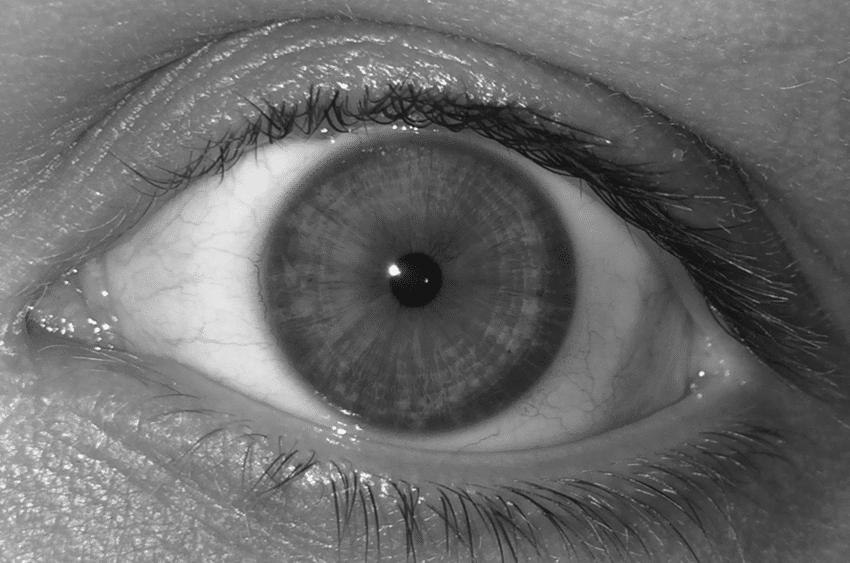

In [5]:
img_path = f"{image_folder}/convolution.png"

img = cv2.imread(img_path, 0)

cv2_imshow(img)

## Laplacian Filter

![image](https://github.com/seccily/yoga-analyzer/assets/52993055/7a010a45-588d-4e49-8dd8-a3148592b686)


In [6]:
# define the laplacian filter

laplacian_kernel = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
laplacian_kernel

array([[ 0, -1,  0],
       [-1,  4, -1],
       [ 0, -1,  0]])

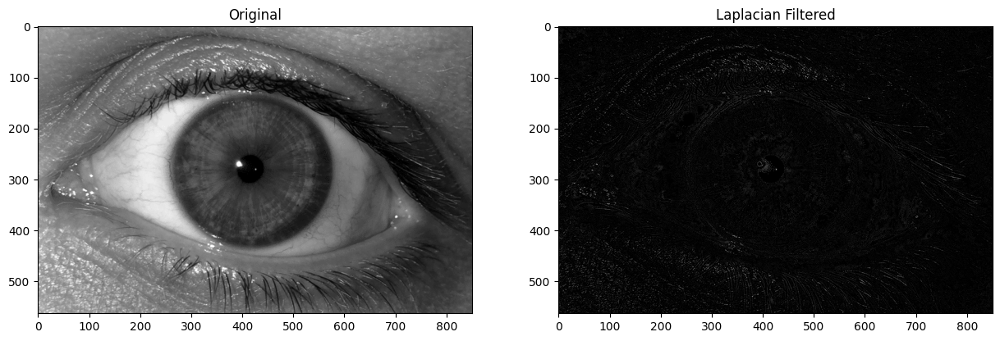

In [7]:
# apply convolution

laplacian_filtered = cv2.filter2D(img, -1, laplacian_kernel)

plot_side_by_side(img, laplacian_filtered, "Original", "Laplacian Filtered")

## Laplacian of Gaussian (LoG)

![image](https://github.com/seccily/yoga-analyzer/assets/52993055/e75d5c85-1a9c-4514-a768-102bbafc2fce)


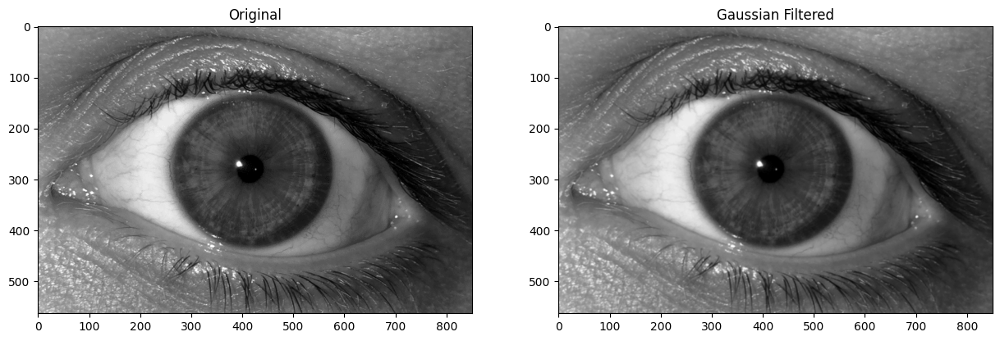

In [8]:
# apply gaussian blur first

gaussian_image = cv2.GaussianBlur(img, (3, 3), 0)

plot_side_by_side(img, gaussian_image, "Original", "Gaussian Filtered")

> Note:  `0` specifies the standard deviation of the Gaussian kernel along the x-axis and y-axis. A standard deviation of 0 implies that the standard deviation will be calculated based on the kernel size

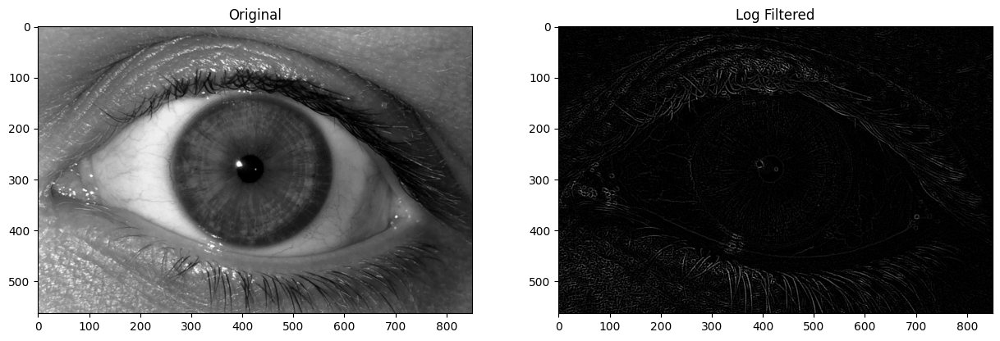

In [9]:
# apply laplacian filter to the gaussian blurred image

log_filtered  = cv2.Laplacian(gaussian_image, -1, ksize=3)

plot_side_by_side(img, log_filtered, "Original", "Log Filtered")

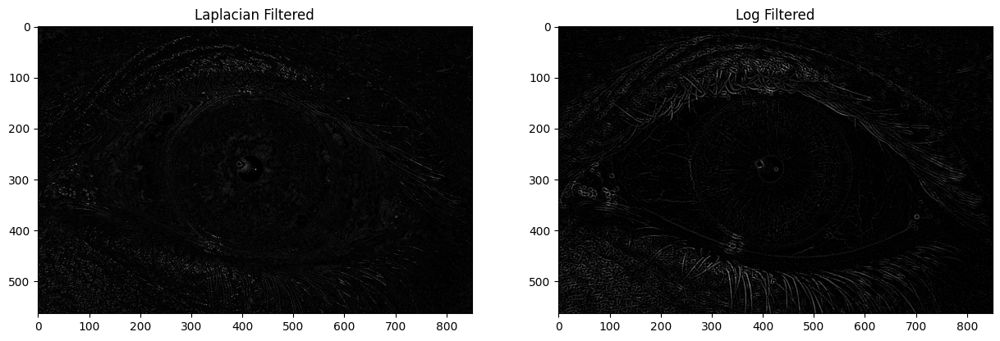

In [10]:
# let's see the difference between laplacian and laplacian of gaussian filters

plot_side_by_side(laplacian_filtered, log_filtered, "Laplacian Filtered", "Log Filtered")

## ***Exercise 1.1*** - Implement the Mean Filter of size 3x3 without using `cv2` or other equivalent libraries. Apply padding to the image to handle borders.

P.S. You can use `np.mean()` function to calculate the mean value of the window.

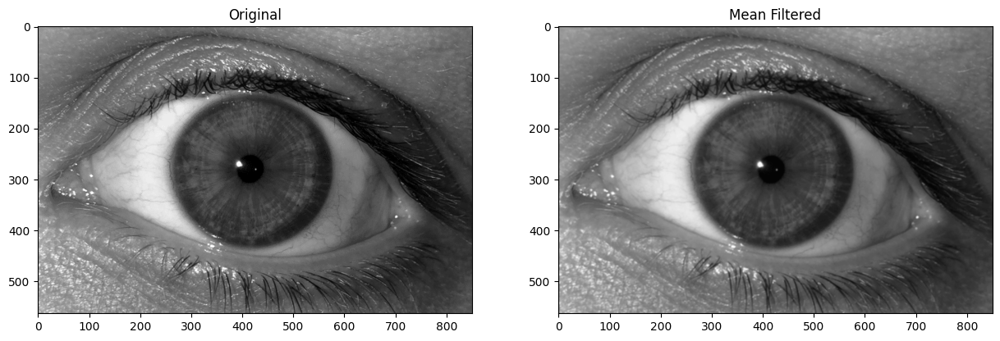

In [11]:
kernel_size = 3

height, width = img.shape

pad_width = int(kernel_size - 1 / 2)                                            # the padding width for each side
padded_image = np.zeros((height + pad_width * 2, width + pad_width * 2))        # create an empty padded image
padded_image[pad_width:-pad_width, pad_width:-pad_width] = img                  # copy the original image into the padded image

filtered_image = np.zeros_like(img)                                             # create an empty image to store the filtered result

for y in range(height):
    for x in range(width):
        window = padded_image[y:y + kernel_size, x:x + kernel_size]              # extract the local window centered at the current pixel
        filtered_image[y, x] = np.mean(window)                                   # calculate the mean value of the window and assign it to the corresponding pixel in the filtered image

plot_side_by_side(img, filtered_image, "Original", "Mean Filtered")

## ***Exercise 1.2*** - Implement the Mean Filter of size 3x3 without using `cv2` or other equivalent libraries. Apply convolution operation with mean kernel instead of using `np.mean()` function. Do not forget to apply padding to the image to handle borders.

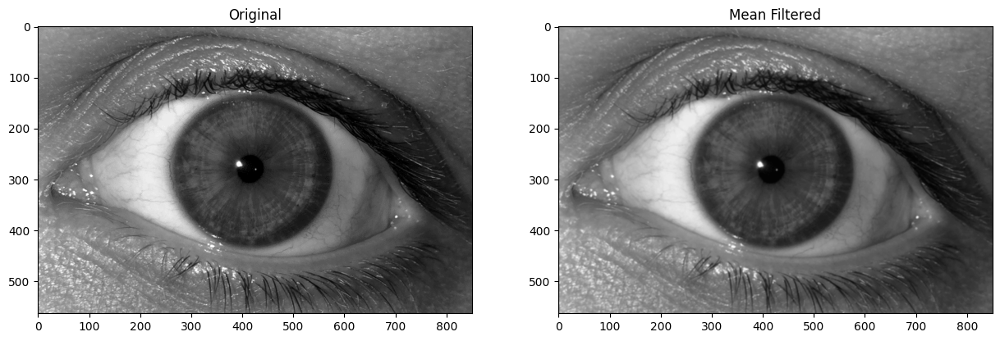

In [12]:
kernel_size = 3

kernel = np.ones((kernel_size, kernel_size)) / (kernel_size * kernel_size)
# kernel = 1/9 * np.ones((3, 3), np.float32)

kernel = np.flipud(np.fliplr(kernel))                                           # flip the kernel

height, width = img.shape

pad_width = int(kernel_size - 1 / 2)                                            # the padding width for each side
padded_image = np.zeros((height + pad_width * 2, width + pad_width * 2))        # create an empty padded image
padded_image[pad_width:-pad_width, pad_width:-pad_width] = img                  # copy the original image into the padded image

filtered_image = np.zeros_like(img)                                             # create an empty image to store the filtered result

for x in range(width):
    for y in range(height):
        filtered_image[y, x] = (kernel * padded_image[y: y+3, x: x+3]).sum()

plot_side_by_side(img, filtered_image, "Original", "Mean Filtered")

## Why do we need to flip the kernel before applying convolution?

When performing the convolution, you want the kernel to be flipped with respect to the axis along which you're performing the convolution because if you don't, you end up computing a correlation of a signal with itself.

When the kernel is flipped, the minus sign in the formula accounts for the reverse direction of the displacement relative to the current position in the input image. So, while the positive values of `i` and `j` correspond to moving the kernel to the right and down from the current position, the negative values of `i` and `j` correspond to moving the kernel to the left and up, respectively.

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/7d56985a-88ba-4e2f-be39-15ddde5a2901)



![image](https://github.com/d2l-ai/d2l-en/assets/52993055/514db4a0-fa73-4ae8-b982-61833db3c364)


# 2. Image Downsampling

(599, 462, 3)


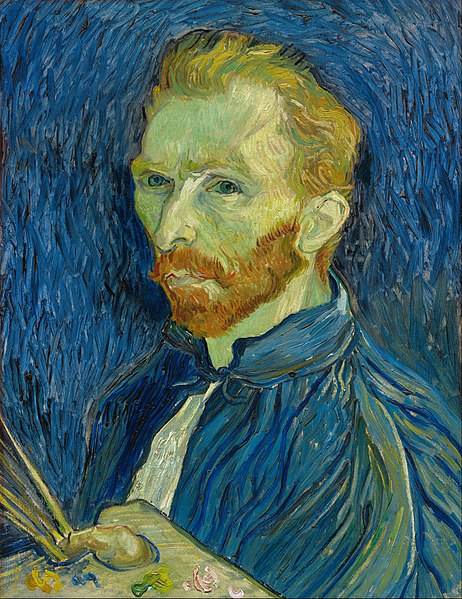

In [13]:
van_gogh = cv2.imread(f"{image_folder}/van_gogh.jpg")
print(van_gogh.shape)
cv2_imshow(van_gogh)

## Naive Downsampling

In [14]:
scale_factor = 4                                                                # define a scale factor

height, width, channels = van_gogh.shape

width_downsampled = int(width / scale_factor)                                   # calculate the downsampled width
height_downsampled = int(height / scale_factor)                                 # calculate the downsampled height

### openCV implementation

> OpenCV provides us several interpolation methods for resizing an image:
> * `cv2.INTER_AREA`: This is used when we need to shrink an image.
> * `cv2.INTER_CUBIC`: This is slow but more efficient.
> * `cv2.INTER_LINEAR`: This is primarily used when zooming is required. This is the default interpolation technique in OpenCV.

(149, 115, 3)


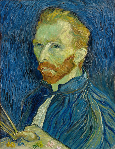

In [15]:
downsampled_img = cv2.resize(van_gogh, (width_downsampled, height_downsampled)) # apply downsampling with cv2

print(downsampled_img.shape)
cv2_imshow(downsampled_img)

### ***Exercise 2.1*** - Implement the naive downsampling algorithm from scratch.

P.S. You cannot use `cv2.resize()` function.


In [16]:
def downsample(image, scale_factor):

    height, width, channels = image.shape

    width_downsampled = int(width / scale_factor)
    height_downsampled = int(height / scale_factor)

    downsampled_img = np.zeros((height_downsampled, width_downsampled, channels), dtype=np.uint8)

    for y in range(height_downsampled):
        for x in range(width_downsampled):

            # For example, we want to reduce the dimensions of the image by a factor of 8 in both
            # width and height. This means that for every 8 pixels in the original image, we will
            # only keep 1 pixel in the downsampled image.

            original_x = int(x * scale_factor)
            original_y = int(y * scale_factor)

            downsampled_img[y, x] = image[original_y, original_x]

    return downsampled_img

(149, 115, 3)


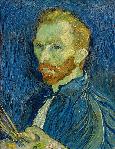

In [17]:
downsampled_img = downsample(van_gogh, scale_factor)

print(downsampled_img.shape)
cv2_imshow(downsampled_img)

### Let's compare images downsampled with factors of 2 and 8.



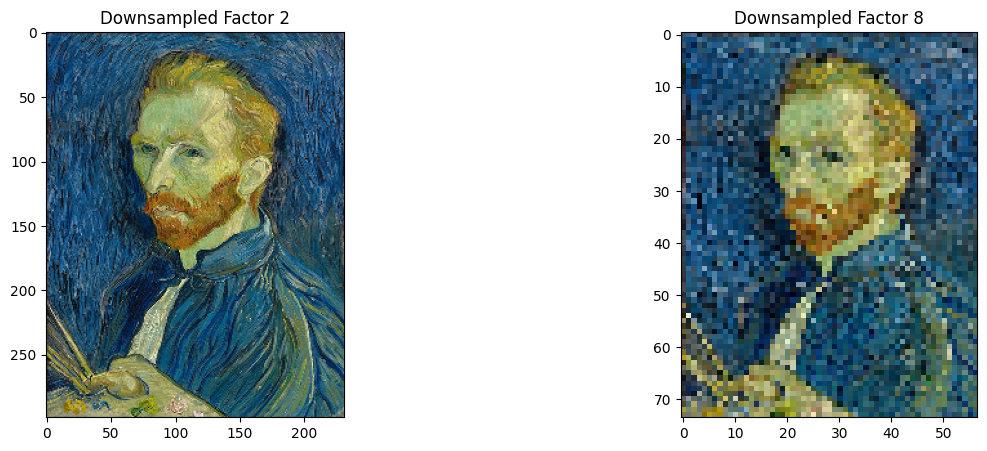

In [18]:
downsampled_img_factor_2 = downsample(van_gogh, 2)
downsampled_img_factor_8 = downsample(van_gogh, 8)

plot_side_by_side(downsampled_img_factor_2, downsampled_img_factor_8, "Downsampled Factor 2", "Downsampled Factor 8")

## ***Exercise 2.2*** - Improved Downsampling

Apply a smoothing filter first, then throw away half the
rows and columns like we did in the previous exercise. Do not use cv2 or any equivalent libraries.

Tip: *Remember smoothing effect filters. Revisit our last lab to implement the filter. Do not forget to adapt our filter implementation to work with the 3-channel images.*

***Gaussian Kernel***


![image](https://github.com/d2l-ai/d2l-en/assets/52993055/9590ed1d-9b86-4a58-87ea-2bbd21ac6aec)

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/26f6cdff-9f1d-456a-bb68-d735e67516fc)


In [19]:
def gaussian_kernel(k_size, sigma=0.85):
    # return 1/16 * np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])

    kernel = np.fromfunction(lambda x, y: (1/(2*np.pi*sigma**2)) * np.exp(-((x-(k_size-1)/2)**2 + (y-(k_size-1)/2)**2)/(2*sigma**2)), (k_size, k_size))
    return kernel / np.sum(kernel)  # to normalize the kernel

gaussian_kernel(3)

array([[0.06256912, 0.12499996, 0.06256912],
       [0.12499996, 0.24972366, 0.12499996],
       [0.06256912, 0.12499996, 0.06256912]])

> ***Note:*** Subtracting $(kernelsize−1)/2$ from the coordinate ensures that we correctly calculate the distance of each pixel from the center of the kernel

> ***Note:*** Normalizing the Gaussian kernel by dividing it by the sum of all its elements ensures that the sum of the kernel's weights is equal to 1.

In [20]:
def gaussian_blur(img, kernel_size=3):

    kernel = gaussian_kernel(kernel_size)

    kernel = np.flipud(np.fliplr(kernel))                                                       # flip the kernel

    height, width, channels = img.shape

    pad_width = int(kernel_size - 1 / 2)                                                        # the padding width for each side

    padded_image = np.zeros((height + pad_width * 2, width + pad_width * 2, channels))          # create an empty padded image

    padded_image[pad_width:-pad_width, pad_width:-pad_width, :] = img                           # copy the original image into the padded image

    filtered_image = np.zeros_like(img)                                                         # create an empty image to store the filtered result

    for c in range(channels):
        for x in range(width):
            for y in range(height):
                filtered_image[y, x, c] = (kernel * padded_image[y: y+kernel_size, x: x+kernel_size, c]).sum()

    return filtered_image

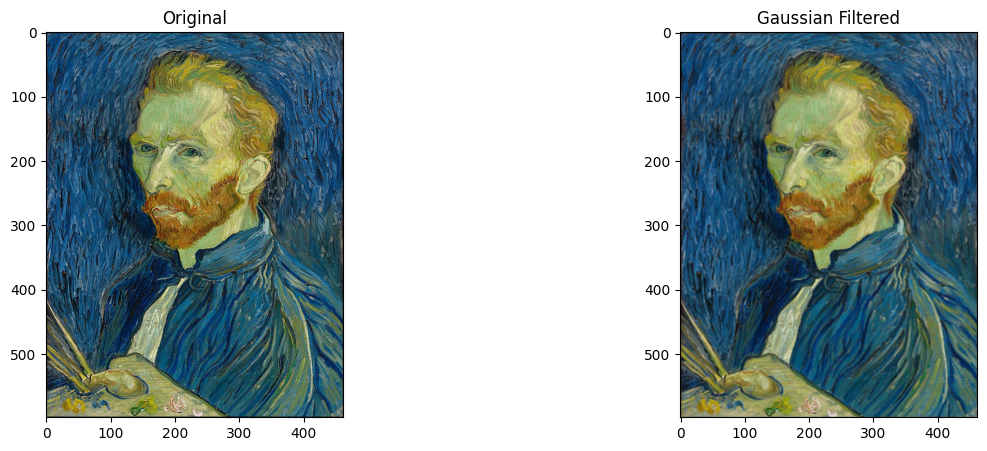

In [21]:
gaussian_image = gaussian_blur(van_gogh, 3)

plot_side_by_side(van_gogh, gaussian_image, "Original", "Gaussian Filtered")

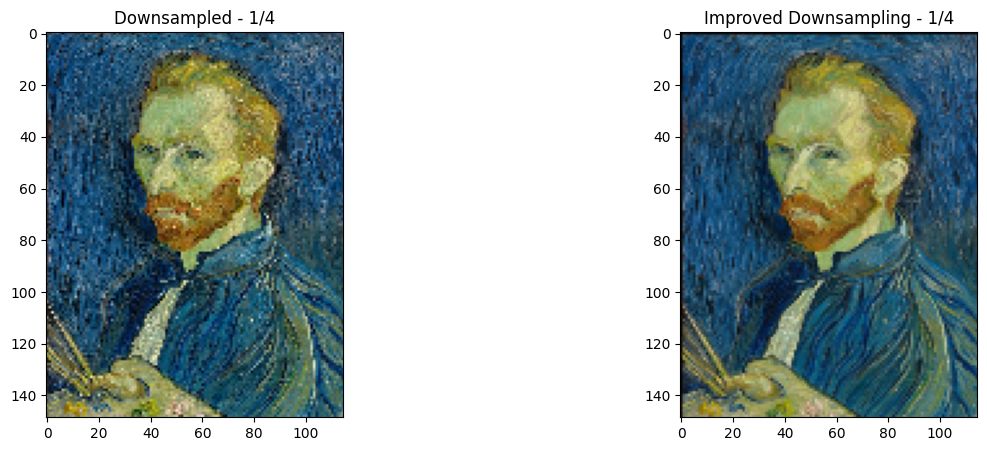

In [22]:
scale_factor = 4

downsampled = downsample(van_gogh, scale_factor)
improved_downsampled = downsample(gaussian_image, scale_factor)

plot_side_by_side(downsampled, improved_downsampled, f"Downsampled - 1/{scale_factor}", f"Improved Downsampling - 1/{scale_factor}")

# 3. Image Pyramids

## Gaussian Image Pyramid

### openCV implementation

In [23]:
def generate_gaussian_pyramid_cv2(image, num_levels):
    pyramid = [image]                                       # add the original image to the pyramid as the first level

    for _ in range(num_levels - 1):                         # generate the gaussian pyramid by reducing the image size by a factor of 2 for each level
        image = cv2.pyrDown(image)                          # reduce the image size by a factor of 2
        pyramid.append(image)                               # add the reduced image to the pyramid

    return pyramid

Level 0


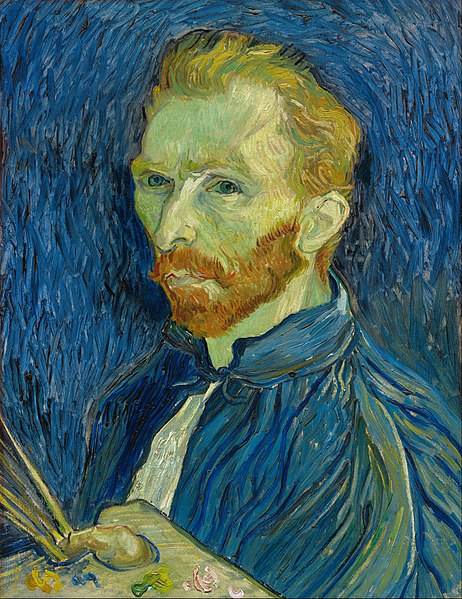

Level 1


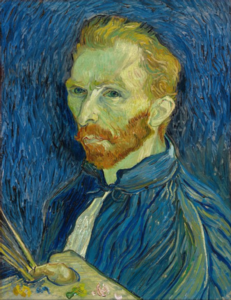

Level 2


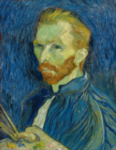

Level 3


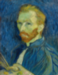

In [24]:
num_levels = 4                                                      # define number of levels in the gaussian pyramid

pyramid = generate_gaussian_pyramid_cv2(van_gogh, num_levels)       # generate the gaussian pyramid

for i, level_image in enumerate(pyramid):
    print(f"Level {i}")
    cv2_imshow(level_image)

### ***Exercise 3.1*** - Gaussian Image Pyramid from scratch

Remember Gaussian pyramid algorithm from the lecture. You need to blur the image and then downsample it by a factor of 2.

We've already implemented the  functions that you need :)

In [25]:
def generate_gaussian_pyramid(image, num_levels):
    pyramid = [image]                               # add the original image to the pyramid as the first level

    for _ in range(num_levels - 1):
        image = gaussian_blur(image)                # apply gaussian filter
        image = image[::2, ::2, :]                  # select every other pixel along both the height and width dimensions (by slicing with a step of 2)
        pyramid.append(image)

    return pyramid

Level 0


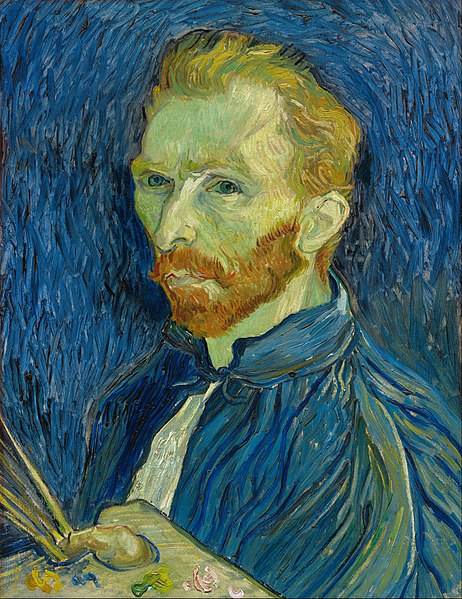

Level 1


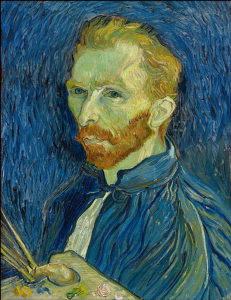

Level 2


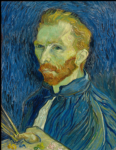

Level 3


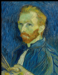

In [26]:
num_levels = 4

pyramid = generate_gaussian_pyramid(van_gogh, num_levels)

for i, level_image in enumerate(pyramid):
    print(f"Level {i}")
    cv2_imshow(level_image)

## ***Exercise 3.2*** - Laplacian Image Pyramid (with OpenCV)

> PS. You can use cv2.pyrUp() for upsampling.

At each level, retain the residuals instead of
the blurred images themselves.

![image](https://github.com/seccily/yoga-analyzer/assets/52993055/7276858a-37aa-4412-b3a2-206fde70b023)


Level 0


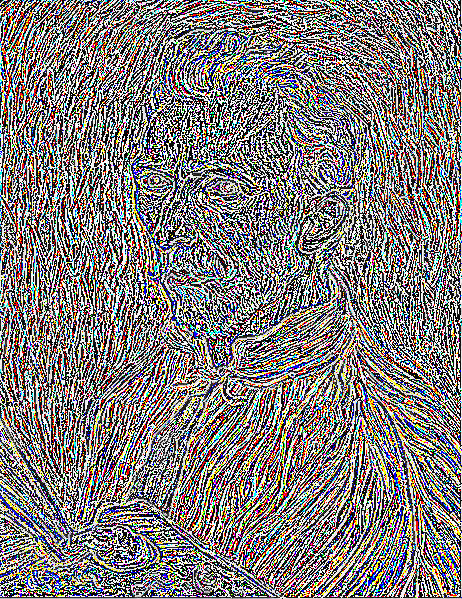

Level 1


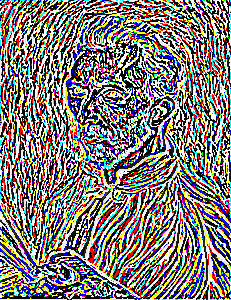

Level 2


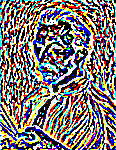

Level 3


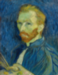

In [27]:
def generate_laplacian_pyramid(image, levels):
    pyramid = []

    gaussian_pyramid = generate_gaussian_pyramid_cv2(image, levels)

    for i in range(levels-1):
        h, w, _ = gaussian_pyramid[i].shape
        upsampled = cv2.pyrUp(gaussian_pyramid[i+1], dstsize=(w, h))            # up-sample the current level
        residual = gaussian_pyramid[i] - upsampled                              # subtract the up-sampled image from the current level
        pyramid.append(residual)                                                # add the level to the pyramid

    pyramid.append(gaussian_pyramid[-1])                                        # add the last level of Gaussian pyramid
    return pyramid

num_levels = 4                                                                  # define the number of levels in the pyramid

laplacian_pyramid = generate_laplacian_pyramid(van_gogh, num_levels)            # generate the laplacian pyramid

for i, level_image in enumerate(laplacian_pyramid):
    print(f"Level {i}")
    cv2_imshow(level_image)

## ***Exercise 3.3*** - Reconstruct Image from Laplacian Pyramid
![image](https://github.com/seccily/yoga-analyzer/assets/52993055/35d9ca28-6d54-422f-87d6-6e3bc47a69c4)


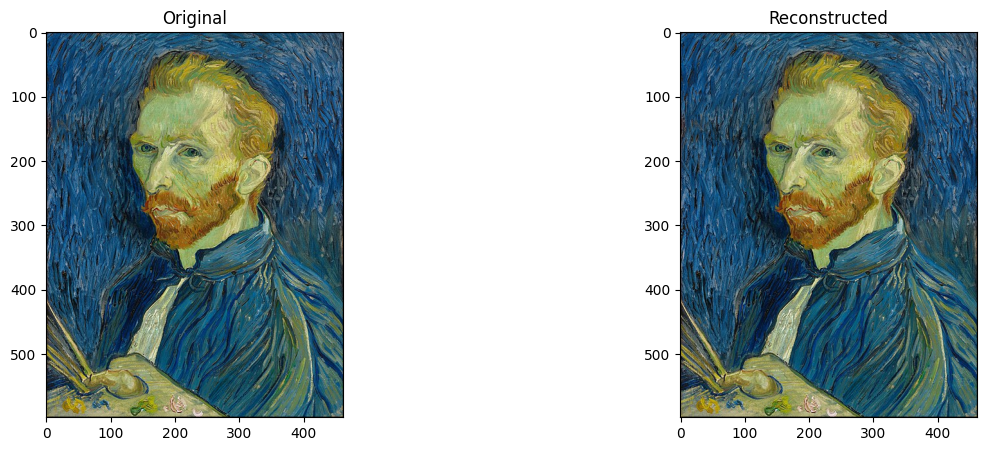

In [28]:
def reconstruct_image_from_pyramid(laplacian_pyramid):
    reconstructed_image = laplacian_pyramid[-1]

    for i in range(len(laplacian_pyramid)-2, -1, -1):                           # go in reverse order
        height, width, _ = laplacian_pyramid[i].shape
        upsampled = cv2.pyrUp(reconstructed_image, dstsize=(width, height))     # up-sample the current level
        reconstructed_image = upsampled + laplacian_pyramid[i]                  # add the up-sampled image to the current level

    return reconstructed_image

reconstructed = reconstruct_image_from_pyramid(laplacian_pyramid)               # reconstruct the image

plot_side_by_side(van_gogh, reconstructed, "Original", "Reconstructed")

# 4. Fourier Transform

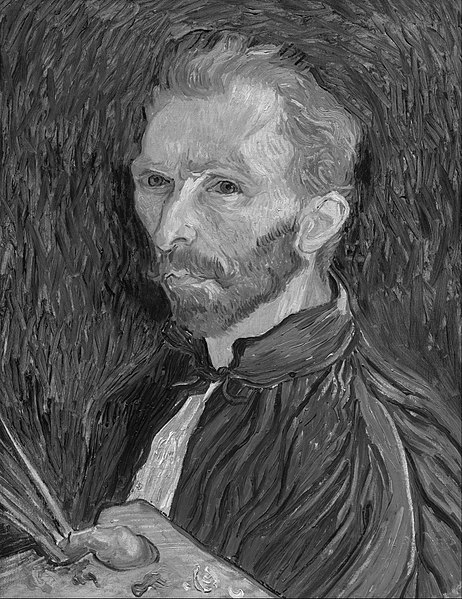

In [29]:
van_gogh_gray = cv2.imread(f"{image_folder}/van_gogh.jpg", 0)
cv2_imshow(van_gogh_gray)

> Do not forget to shift the Fourier Transform to bring the zero-frequency component (also known as the DC component) to the center of the transformed image. This shift makes it easier to analyze the transformed image visually and to interpret the frequency content correctly.

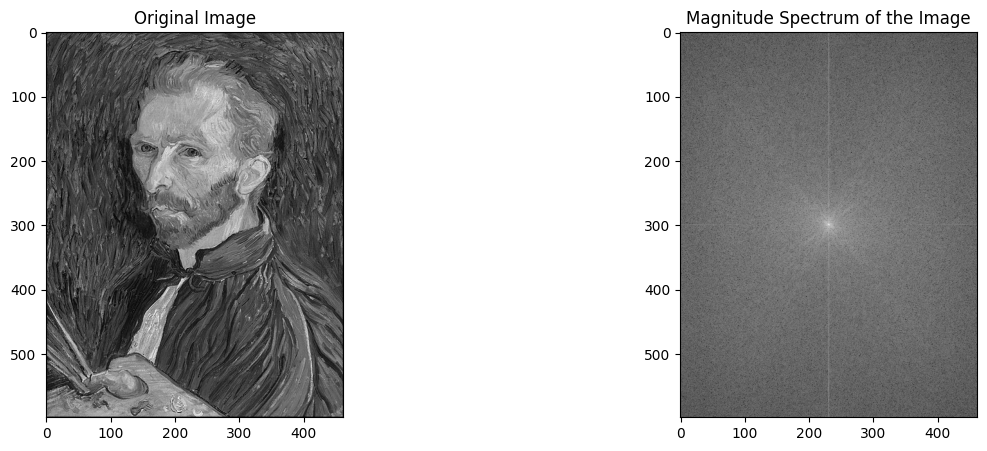

In [30]:
fourier = np.fft.fft2(van_gogh_gray)                                                # compute the 2D Fourier Transform
f_transform_shifted = np.fft.fftshift(fourier)                                      # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                       # log magnitude transform - make the frequency components more visible

# we calculate the magnitude spectrum using np.abs() to get the absolute values (to remove imaginary components) and np.log() to scale the values for better visualization.

plot_side_by_side(van_gogh_gray, magnitude_spectrum, title2="Magnitude Spectrum of the Image")

# the white vertical line refer to the sharp horizontal elements of the image

Text(0.5, 1.0, 'Transformed Greyscale Image')

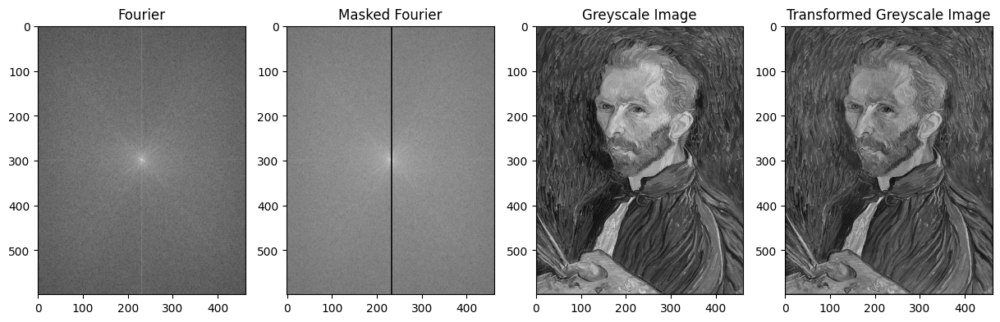

In [31]:
fourier = np.fft.fftshift(np.fft.fft2(van_gogh_gray))       # compute the 2d fourier transform
fourier_masked = fourier.copy()                             # copy the fourier transform
fourier_masked[:, 232:235] = 1                              # mask the frequency components
image_masked = abs(np.fft.ifft2(fourier_masked))            # inverse fourier transform to get the image


fig, ax = plt.subplots(1, 4, figsize=(15,15))

ax[0].imshow(np.log(abs(fourier)), cmap='gray')
ax[0].set_title('Fourier')
ax[1].imshow(np.log(abs(fourier_masked)), cmap='gray')
ax[1].set_title('Masked Fourier')
ax[2].imshow(van_gogh_gray, cmap = 'gray')
ax[2].set_title('Greyscale Image')
ax[3].imshow(image_masked, cmap='gray')
ax[3].set_title('Transformed Greyscale Image')

## ***Exercise 4.1*** - Implement Forward Fourier Transform from Scratch

> P.S. Do not forget to read the image in grayscale.

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/2659a0fb-8b08-468b-b505-d061823c5ebe)

In [32]:
def fft_2d(image):

    height, width = image.shape
    F = np.zeros((height, width),dtype=complex) # to store the fourier transform

    # iterate over each frequency component (u, v)
    for u in range(height):     # vertical frequency component
        for v in range(width):  # horizontal frequency component

            f_uv = 0            # initialize the sum for the Fourier coefficient

            # iterate over each pixel (x, y)
            # within each frequency component (u, v), we need to compute the contribution of each pixel (x, y) in the spatial domain

            for y in range(height):
                for x in range(width):
                    e = np.exp(- 2j * np.pi * ((u * y) / height + (v * x) / width))
                    f_uv +=  image[y, x] * e

            F[u, v] = f_uv / (width * height)

    return F

def fft_shift(F):
    height, width = F.shape
    shifted_F = np.zeros((height, width),dtype=complex)

    for i in range(height):
        for j in range(width):
            shifted_F[i, j] = F[(i + height // 2) % height, (j + width // 2) % width]

    return shifted_F

> ***Note:*** `(i + height // 2) % height` This expression calculates the row index. It adds half of the height to the current row index `i`, then takes the remainder when divided by the total height. This ensures that if the index goes beyond the boundaries of the array, it wraps around to the beginning.

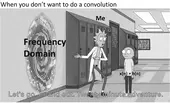

In [33]:
img = cv2.imread(f"{image_folder}/fourier.png", 0)
cv2_imshow(img)

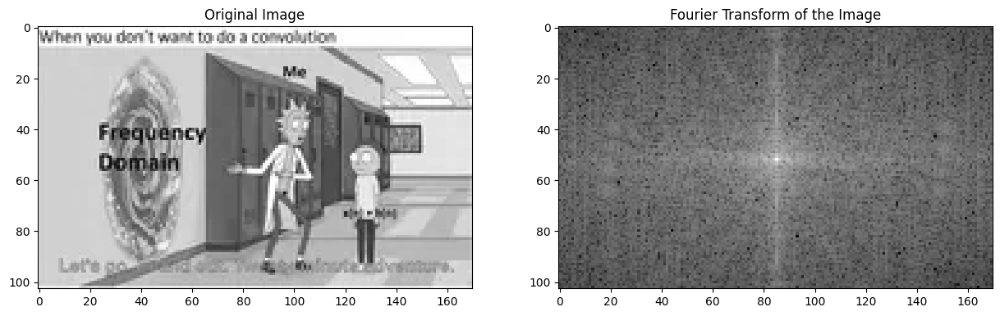

In [34]:
fourier = fft_2d(img)
fourier_shifted = fft_shift(fourier)

magnitude_spectrum = 20 * np.log(np.abs(fourier_shifted))                       # log magnitude transform - make the frequency components more visible

plot_side_by_side(img, magnitude_spectrum, title2="Fourier Transform of the Image")

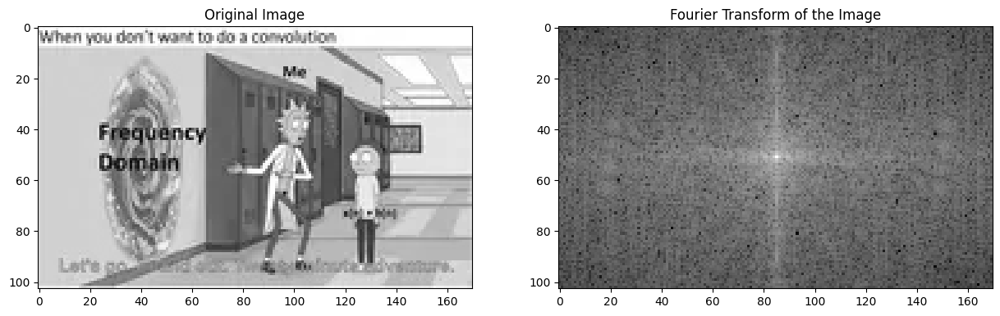

In [35]:
# Let's compare the result with fourier transform using numpy library

fourier = np.fft.fft2(img)                                                      # compute the 2D Fourier Transform
f_transform_shifted = np.fft.fftshift(fourier)                                  # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                   # log magnitude transform - make the frequency components more visible

plot_side_by_side(img, magnitude_spectrum, title2="Fourier Transform of the Image")

## ***Exercise 4.2*** - Implement Inverse Fourier Transform from Scratch

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/40ff8765-f039-411d-8956-1dd64a318b87)

You can refer [here](https://homepages.inf.ed.ac.uk/rbf/HIPR2/fourier.htm) for the details of the formula.

In [36]:
def ift_2d(F):
    height, width = F.shape
    inverse_F = np.zeros((height, width), dtype=np.complex128)

    # iterate over each pixel (x, y)
    for x in range(height):
        for y in range(width):

            f_x_y = 0       # initialize the sum for the inverse Fourier transformed pixel

            # iterate over each frequency component (u, v)
            for u in range(height):
                for v in range(width):
                    # the contribution of each frequency component to the inverse Fourier transformed image at pixel (x, y)
                    f_x_y += F[u, v] * np.exp(2j * np.pi * ((u * x) / height + (v * y) / width))

            inverse_F[x, y] = f_x_y

    return inverse_F

> When reconstructing images from the frequency domain using inverse Fourier transform, the resulting image may contain both real and imaginary components. Since images are typically represented as arrays of real numbers, we display only the real part for simplicity and visualization purposes. This is because the real part alone provides a visually interpretable representation of the reconstructed image.

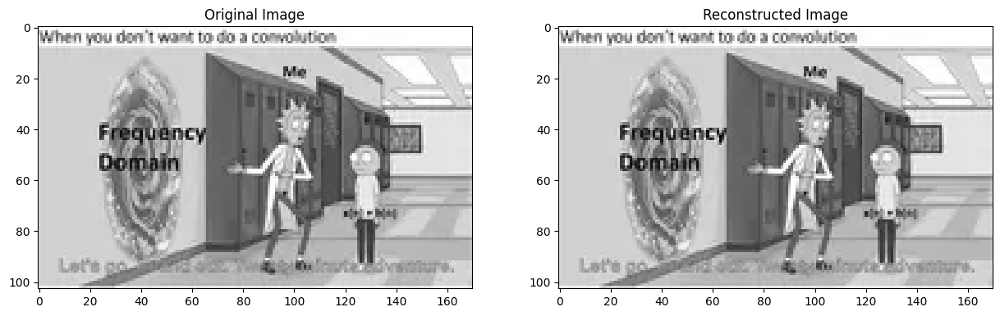

In [37]:
reconstructed = ift_2d(fourier)                     # apply inverse fourier transform to previosly calculated fourier transform

plot_side_by_side(img, reconstructed.real, title2="Reconstructed Image")

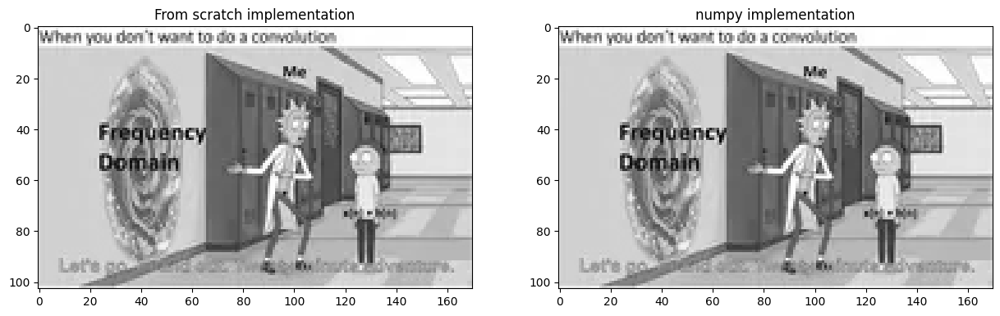

In [38]:
# Let's compare the result with inverse fourier transform using numpy library

reconstructed_np = np.fft.ifft2(fourier)

plot_side_by_side(reconstructed.real, reconstructed_np.real,  "From scratch implementation", "numpy implementation")

## ***Exercise 4.3*** - Let's see that multiplication in the fourier domain is equivalent to convolution in the spatial domain

![image](https://github.com/d2l-ai/d2l-en/assets/52993055/c856b135-7c83-400c-933c-0da428c3b65a)


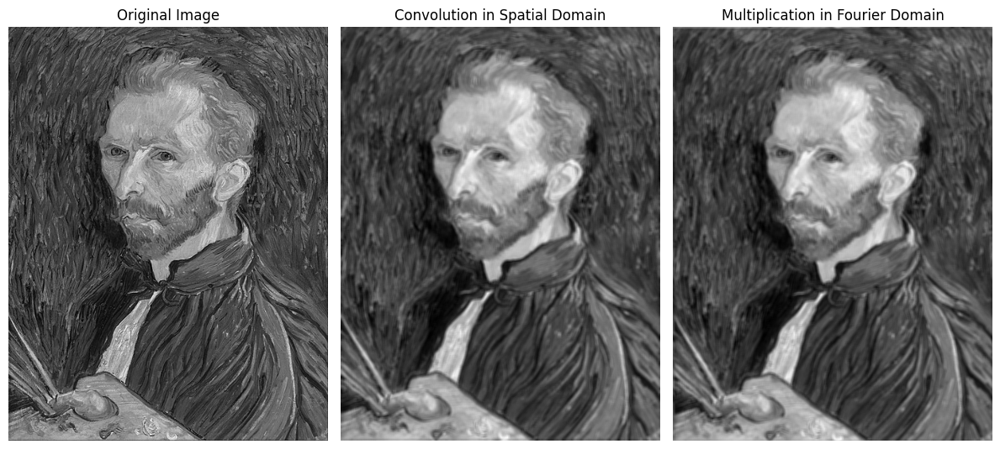

In [39]:
kernel_size = 5
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size**2)     # define a mean kernel with size of 5

convolution_result = cv2.filter2D(van_gogh_gray, -1, kernel)                    # apply convolution operation with the kernel

van_gogh_gray_fft = np.fft.fft2(van_gogh_gray)                                  # fourier transform of the image
kernel_fft = np.fft.fft2(kernel, s=van_gogh_gray.shape)                         # fourier transform of the kernel

fft_result = np.fft.ifft2(van_gogh_gray_fft * kernel_fft).real                  # multiplication in the fourier domain

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(van_gogh_gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(convolution_result, cmap='gray')
plt.title('Convolution in Spatial Domain')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(fft_result, cmap='gray')
plt.title('Multiplication in Fourier Domain')
plt.axis('off')

plt.tight_layout()
plt.show()

## High-Pass Filter

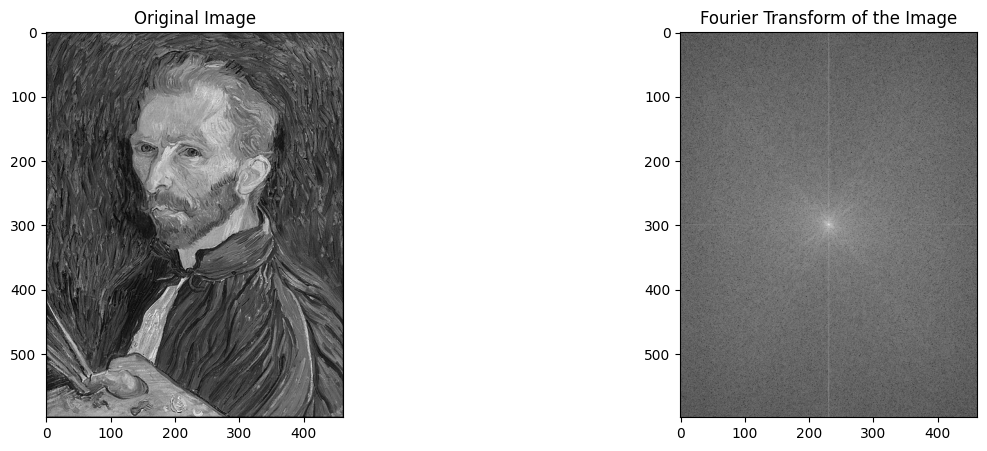

In [40]:
fourier = np.fft.fft2(van_gogh_gray)                                                # compute the 2d fourier transform
f_transform_shifted = np.fft.fftshift(fourier)                                      # shift the zero-frequency component
magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))                       # log magnitude transform - make the frequency components more visible

plot_side_by_side(van_gogh_gray, magnitude_spectrum, title2="Fourier Transform of the Image")

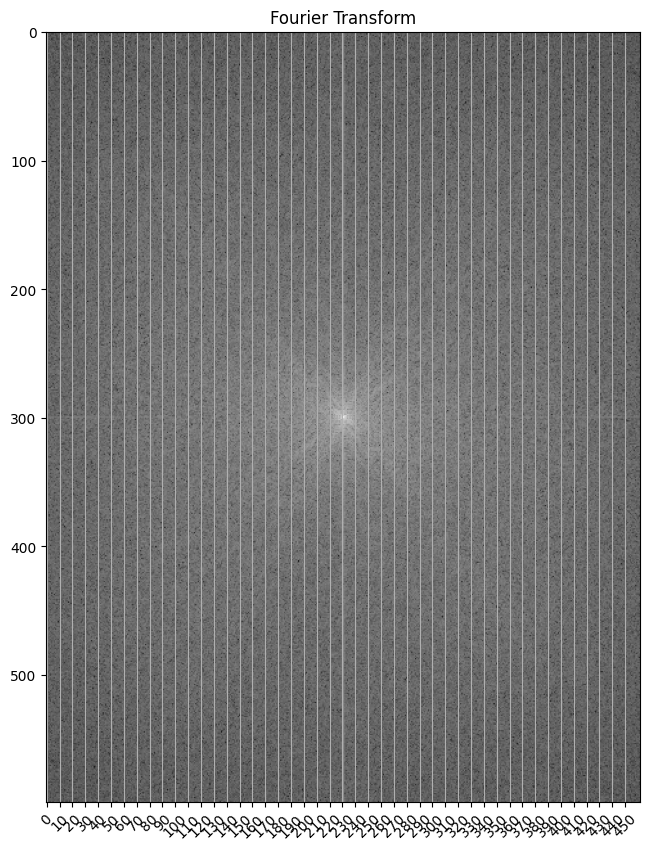

In [41]:
# let's examine the fourier transform

plt.figure(figsize=(10, 10))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.xticks(np.arange(0, 460, 10), rotation=45)
plt.grid(axis = 'x')
plt.title('Fourier Transform')
plt.show()

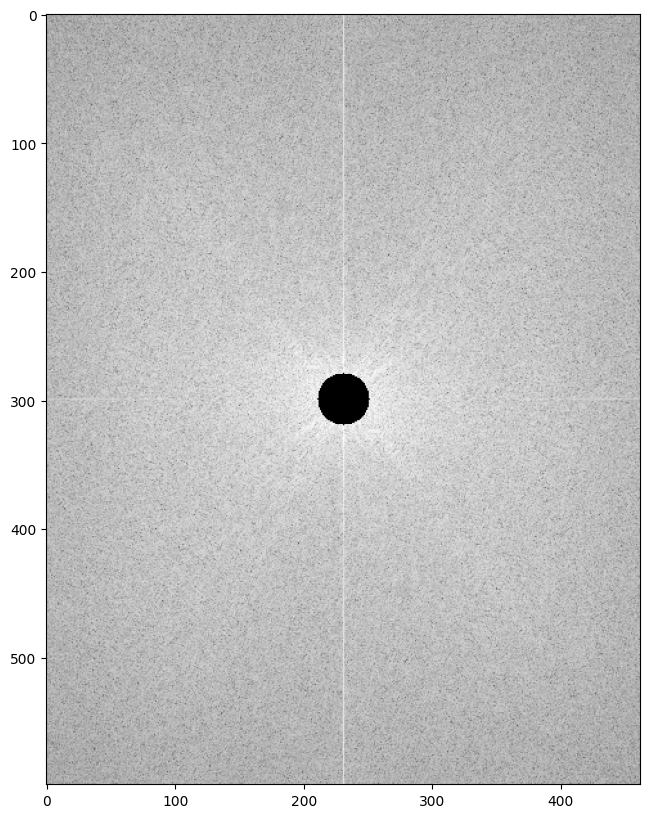

In [42]:
# let's draw a circle representing our high pass filter

height, width = van_gogh_gray.shape
center_h, center_w = height // 2, width // 2

high_pass_filter = magnitude_spectrum.copy()

radius = 20
thickness = -1

high_pass_filter = cv2.circle(high_pass_filter, (center_w, center_h), radius, 1, thickness)

plt.figure(figsize=(10, 10))
plt.imshow(high_pass_filter, cmap='gray')

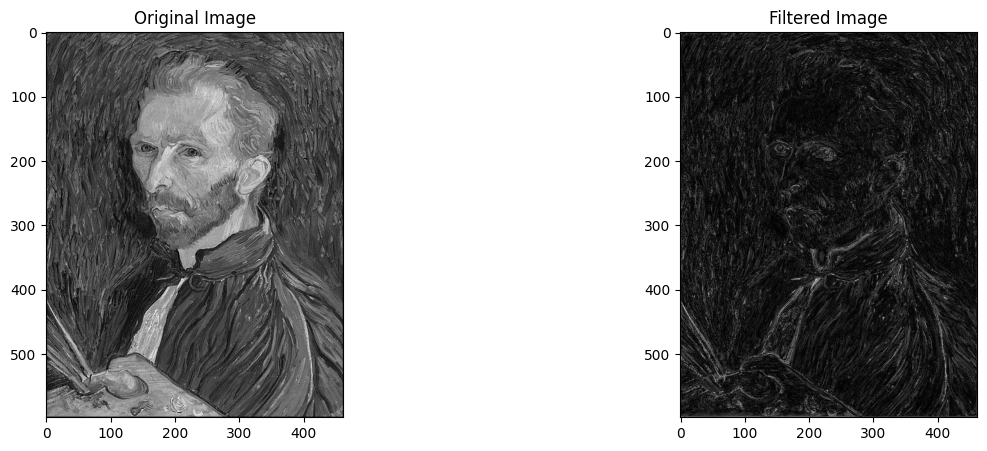

In [43]:
def high_pass_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):
            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain
            if distance <= radius:                                                                  # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    # the reason for taking the absolute value in this context is related to the nature of complex numbers
    # taking the absolute value effectively removes the imaginary component, resulting in a real-valued image

    return denoised_image, filter_mask

high_pass_filtered, filter = high_pass_filter(van_gogh_gray, radius, thickness)

plot_side_by_side(van_gogh_gray, high_pass_filtered, "Original Image", "Filtered Image")

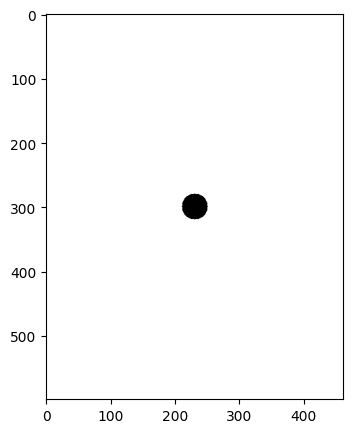

In [44]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')

## Low-Pass Filter

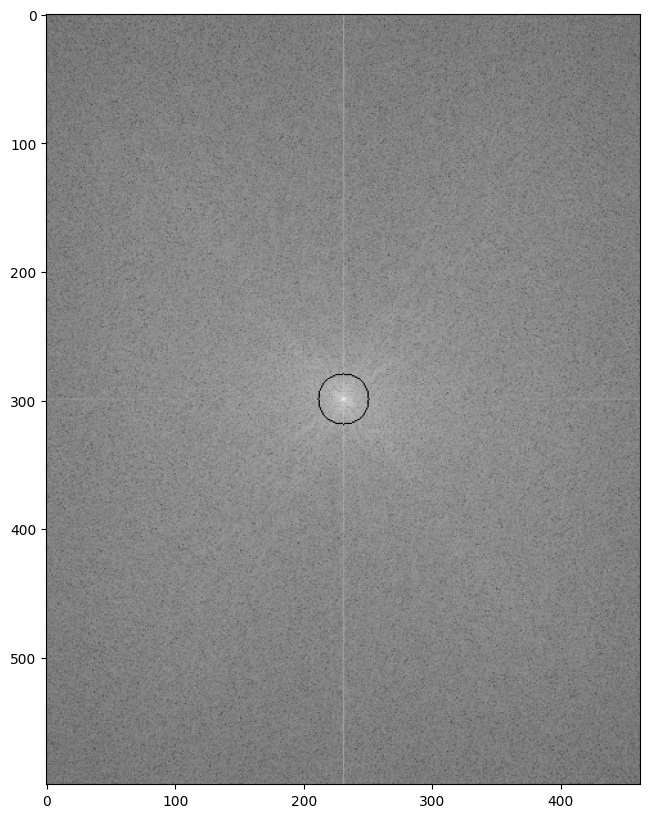

In [45]:
# let's draw a circle representing our low pass filter

height, width = van_gogh_gray.shape
center_h, center_w = height // 2, width // 2

low_pass_filter = magnitude_spectrum.copy()

radius = 20
thickness = 1

low_pass_filter = cv2.circle(low_pass_filter, (center_w, center_h), radius, 1, thickness)

plt.figure(figsize=(10, 10))
plt.imshow(low_pass_filter, cmap='gray')

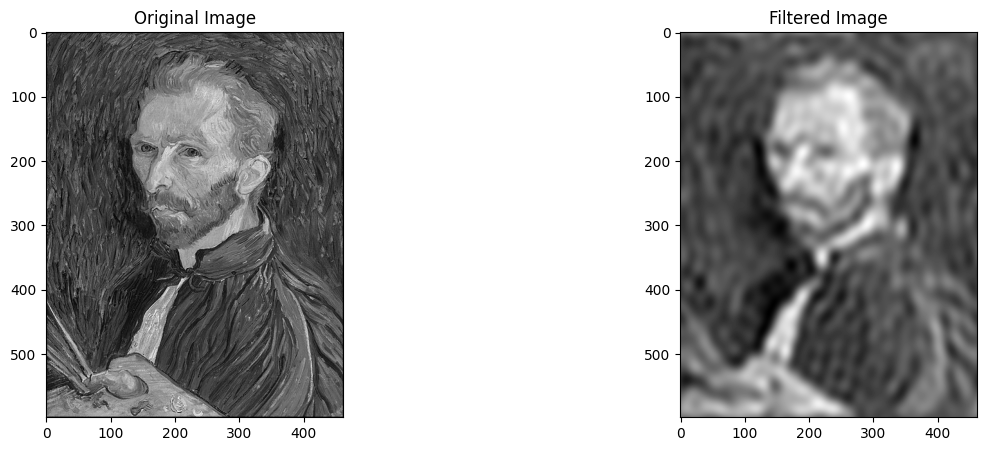

In [46]:
def low_pass_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):

            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain

            if distance >= radius:                                                                  # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    return denoised_image, filter_mask

low_pass_filter, filter = low_pass_filter(van_gogh_gray, radius, thickness)

plot_side_by_side(van_gogh_gray, low_pass_filter, "Original Image", "Filtered Image")

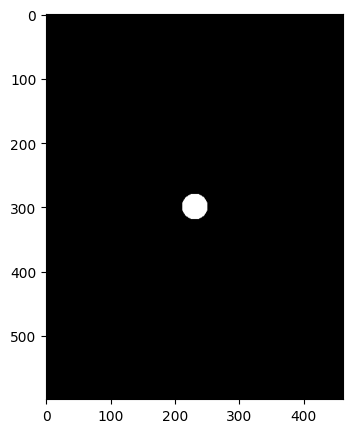

In [47]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')

## ***Exercise 4.4*** - You’ll find an aerial image of the city of Pompeii, in the images folder (`pompeii.png`). It is corrupted with sinusoidal noise due to electrical interference. Examine its Fourier transform and implement an appropriate `band reject filter` to denoise it.

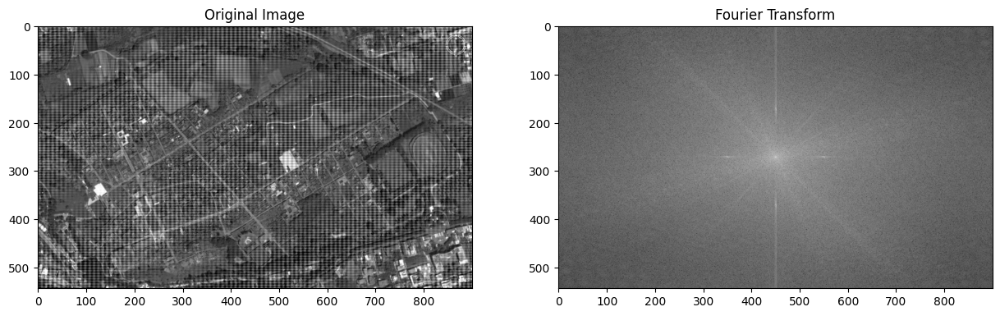

In [48]:
pompeii = cv2.imread(f"{image_folder}/pompeii.png", 0)
pompeii_fft = np.fft.fft2(pompeii)
pompeii_fft_shifted = np.fft.fftshift(pompeii_fft)

magnitude_spectrum = 20 * np.log(np.abs(pompeii_fft_shifted))

plot_side_by_side(pompeii, magnitude_spectrum, "Original Image", "Fourier Transform")

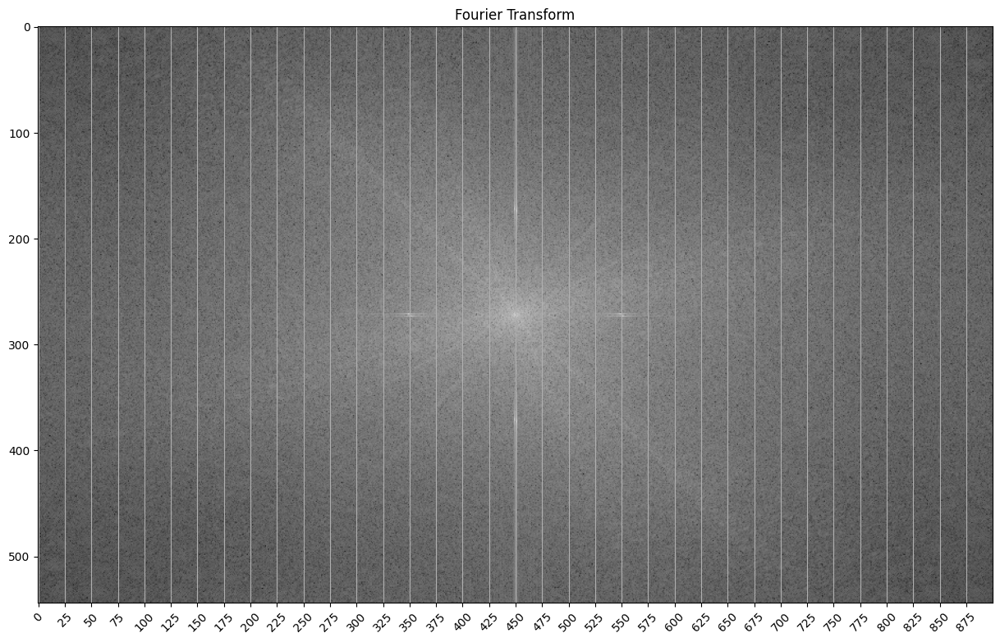

In [49]:
# Let's take a closer look to the fourier transform

plt.figure(figsize=(15, 15))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.xticks(np.arange(0, 900, 25), rotation=45)
plt.grid(axis = 'x')
plt.title('Fourier Transform')
plt.show()

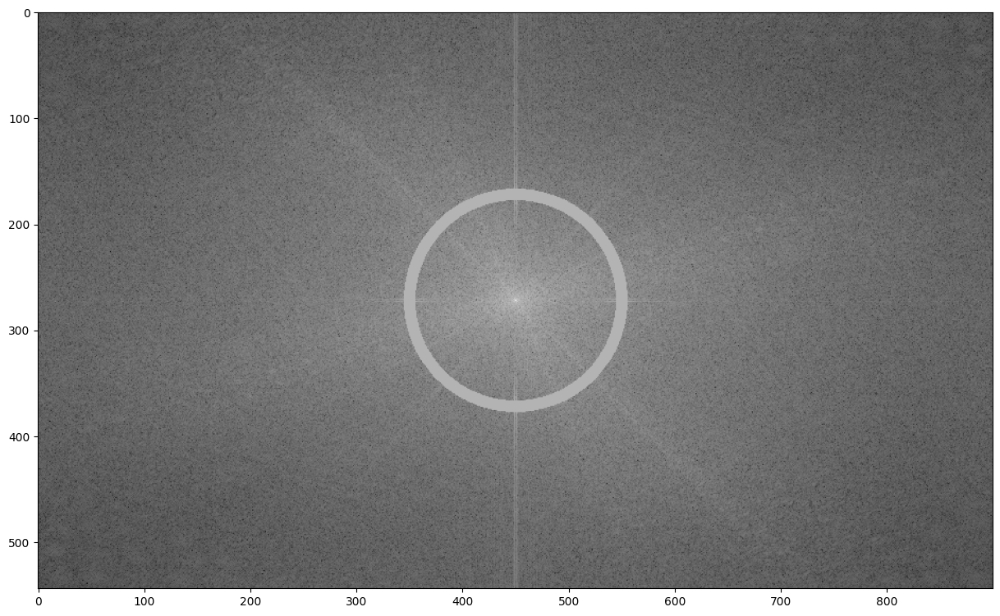

In [50]:
# Let's draw a circle representing our band_ reject filter

height, width = pompeii.shape
center_h, center_w = height // 2, width // 2

band_rej_filter = magnitude_spectrum.copy()

radius = (550 - 350) // 2
thickness = 20

band_rej_filter = cv2.circle(band_rej_filter, (center_w, center_h), radius, 255, thickness // 2)

plt.figure(figsize=(15, 15))
plt.imshow(band_rej_filter, cmap='gray')

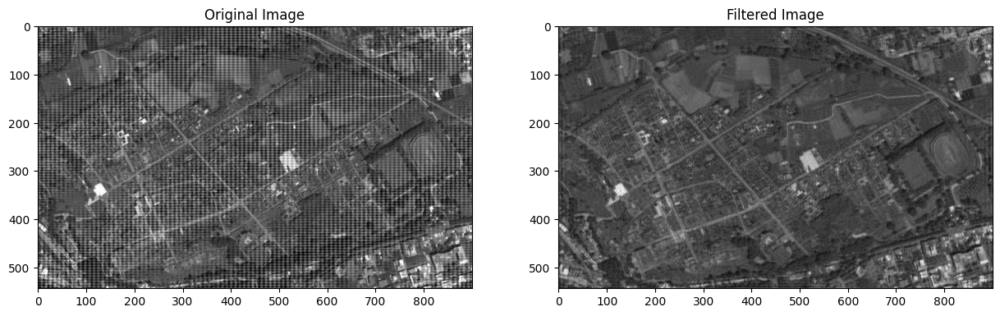

In [51]:
def band_reject_filter(image, radius, thickness):
    f_transform = np.fft.fft2(image)                                                                # fourier transform
    f_transform_shifted = np.fft.fftshift(f_transform)                                              # shift zero frequency to the center

    height, width = f_transform_shifted.shape
    center_h, center_w = height // 2, width // 2

    filter_mask = np.ones((height, width), dtype=np.uint8)                                          # initialize the filter

    # iterate over each frequency component (u, v)
    for u in range(height):
        for v in range(width):
            distance = np.sqrt((u - center_h) ** 2 + (v - center_w) ** 2)                           # calculate the distance from the center of the frequency domain
            if distance >= (radius - thickness // 2) and distance <= (radius + thickness // 2):     # if the distance falls within the specified band to be rejected
                filter_mask[u, v] = 0

    f_transform_shifted_filtered = f_transform_shifted * filter_mask                                # apply filter to frequency domain image
    denoised_image = np.abs(np.fft.ifft2(np.fft.ifftshift(f_transform_shifted_filtered)))           # inverse Fourier transform to obtain denoised image

    return denoised_image, filter_mask

band_reject_applied, filter = band_reject_filter(pompeii, radius, thickness)

plot_side_by_side(pompeii, band_reject_applied, "Original Image", "Filtered Image")

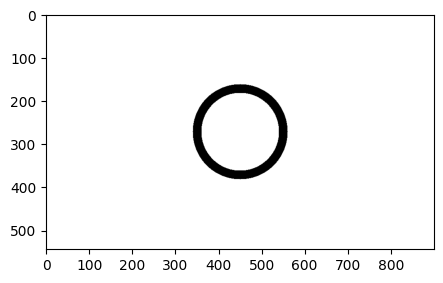

In [52]:
plt.figure(figsize=(5, 5))
plt.imshow(filter, cmap='gray')